# Import Essential Libraries 

In [1]:
!pip install fredapi
!pip install TensorFlow
!pip install pmdarima
!pip install tensorpac

import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import math
import tensorflow as tf
import pmdarima as pm
import plotly.express as px
import plotly.graph_objects as go

from fredapi import Fred
from plotly.subplots import make_subplots
from plotly.offline import iplot, init_notebook_mode
from pandas import Series
from pmdarima.arima import auto_arima

from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.api import SARIMAX, AutoReg
from statsmodels.tsa.arima.model import ARIMAResults
from tensorflow import keras
from tensorflow.keras import layers
from tensorpac.stats import test_stationarity

sb.set()

# Data Science Pipeline : Sample Collection

# Importing and Understanding the Data

In [2]:
SPX = pd.read_csv('SPX.csv')
SPX

,Date,Open,High,Low,Close,Adj Close,Volume
0,1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
2,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
3,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
4,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0
...,...,...,...,...,...,...,...
23318,2020-10-29,3277.169922,3341.050049,3259.820068,3310.110107,3310.110107,4903070000
23319,2020-10-30,3293.590088,3304.929932,3233.939941,3269.959961,3269.959961,4840450000
23320,2020-11-02,3296.199951,3330.139893,3279.739990,3310.239990,3310.239990,4310590000
23321,2020-11-03,3336.250000,3389.489990,3336.250000,3369.159912,3369.159912,4220070000


In [3]:
SPX['Date'] = pd.to_datetime(SPX['Date'])
SPX.set_index("Date", inplace=True)
SPX_copy = SPX #for plotting candlestick later
SPX

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0
...,...,...,...,...,...,...
2020-10-29,3277.169922,3341.050049,3259.820068,3310.110107,3310.110107,4903070000
2020-10-30,3293.590088,3304.929932,3233.939941,3269.959961,3269.959961,4840450000
2020-11-02,3296.199951,3330.139893,3279.739990,3310.239990,3310.239990,4310590000


In [4]:
SPX.shape

(23323, 6)

In [5]:
SPX.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 23323 entries, 1927-12-30 to 2020-11-04
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       23323 non-null  float64
 1   High       23323 non-null  float64
 2   Low        23323 non-null  float64
 3   Close      23323 non-null  float64
 4   Adj Close  23323 non-null  float64
 5   Volume     23323 non-null  int64  
dtypes: float64(5), int64(1)
memory usage: 1.2 MB


Remove the rows with `Volume = 0`

In [6]:
SPX = SPX[SPX.Volume != 0]
SPX

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1950-01-03,16.660000,16.660000,16.660000,16.660000,16.660000,1260000
1950-01-04,16.850000,16.850000,16.850000,16.850000,16.850000,1890000
1950-01-05,16.930000,16.930000,16.930000,16.930000,16.930000,2550000
1950-01-06,16.980000,16.980000,16.980000,16.980000,16.980000,2010000
1950-01-09,17.080000,17.080000,17.080000,17.080000,17.080000,2520000
...,...,...,...,...,...,...
2020-10-29,3277.169922,3341.050049,3259.820068,3310.110107,3310.110107,4903070000
2020-10-30,3293.590088,3304.929932,3233.939941,3269.959961,3269.959961,4840450000
2020-11-02,3296.199951,3330.139893,3279.739990,3310.239990,3310.239990,4310590000


# Import Economic Data from Fred API

In [7]:
fred = Fred(api_key='94f47cb371e5afc0e7b4f1ade6f0d840')

In [8]:
df = {}

df['gdp'] = fred.get_series('GDP') #quarterly
df['gnp'] = fred.get_series('GNP') #quarterly
df['real_gdp'] = fred.get_series('GDPC1') #quarterly
df['real_gdp_per_capita'] = fred.get_series('A939RX0Q048SBEA') #quarterly
df['net_exports'] = fred.get_series('NETEXP') #quarterly
#gross national income
df['gni'] = fred.get_series('A023RC1Q027SBEA') #quarterly
df['govt_spending'] = fred.get_series('GCEC1') #quarterly
df['consumer_spending'] = fred.get_series('PCEC') #quarterly
df['private_domestic_investment'] = fred.get_series('Y006RC1Q027SBEA') #quarterly
#Consumer Price Index for All Urban Consumers: All Items in U.S. City Average
df['cpi'] = fred.get_series('CPIAUCSL', frequency='q', aggregation_method='avg') #monthly, change to quarterly
#Consumer Price Index for All Urban Consumers: Fuel Oil and Other Fuels in U.S. City Average
df['cpi_oil'] = fred.get_series('CUSR0000SEHE', frequency='q', aggregation_method='avg') #monthly, change to quarterly
#interest rates, discount rates per annum
df['ir'] = fred.get_series('INTDSRUSM193N', frequency='q', aggregation_method='avg') #monthly, change to quarterly
df['unemployment_rate'] = fred.get_series('UNRATE', frequency='q', aggregation_method='avg')

df = pd.DataFrame(df)
df

,gdp,gnp,real_gdp,real_gdp_per_capita,net_exports,gni,govt_spending,consumer_spending,private_domestic_investment,cpi,cpi_oil,ir,unemployment_rate
1939-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1939-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1939-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1939-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1940-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-01,24740.480,24929.184,19924.088,59836.0,-1116.682,25206.201,3393.389,16874.769,674.272,284.894,383.011,NaN,3.8
2022-04-01,25248.476,25456.409,19895.271,59688.0,-1035.565,25725.717,3379.499,17261.338,693.850,291.536,484.727,NaN,3.6
2022-07-01,25723.941,25885.432,20054.663,60080.0,-890.825,26129.107,3410.625,17542.652,702.671,295.496,456.096,NaN,3.6
2022-10-01,26137.992,26289.489,20182.491,60376.0,-857.068,26294.490,3442.466,17749.893,713.389,298.525,470.706,NaN,3.6


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 337 entries, 1939-01-01 to 2023-01-01
Freq: QS-OCT
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   gdp                          304 non-null    float64
 1   gnp                          304 non-null    float64
 2   real_gdp                     304 non-null    float64
 3   real_gdp_per_capita          304 non-null    float64
 4   net_exports                  304 non-null    float64
 5   gni                          304 non-null    float64
 6   govt_spending                304 non-null    float64
 7   consumer_spending            304 non-null    float64
 8   private_domestic_investment  304 non-null    float64
 9   cpi                          304 non-null    float64
 10  cpi_oil                      304 non-null    float64
 11  ir                           286 non-null    float64
 12  unemployment_rate            300 non-null    f

Remove `NaN` values.

In [10]:
df = df.dropna()
df

,gdp,gnp,real_gdp,real_gdp_per_capita,net_exports,gni,govt_spending,consumer_spending,private_domestic_investment,cpi,cpi_oil,ir,unemployment_rate
1950-01-01,280.828,282.056,2186.365,14500.0,2.203,278.734,599.569,182.920,1.071,23.587,11.033,1.50,6.4
1950-04-01,290.383,291.699,2253.045,14889.0,1.643,291.250,610.519,186.806,1.164,23.767,11.133,1.50,5.6
1950-07-01,308.153,309.760,2340.112,15398.0,-0.740,309.130,600.663,200.505,1.247,24.203,11.267,1.61,4.6
1950-10-01,319.945,321.554,2384.920,15623.0,-0.154,320.905,643.100,197.946,1.289,24.693,11.500,1.75,4.2
1951-01-01,336.000,337.537,2417.311,15769.0,0.177,334.071,711.537,209.207,1.296,25.697,11.700,1.75,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-01,19636.731,19805.951,17378.712,52393.0,-526.273,20061.715,3448.043,13049.766,537.107,256.315,218.759,0.25,13.0
2020-07-01,21362.428,21562.441,18743.720,56479.0,-692.412,21365.888,3395.877,14388.701,561.469,259.239,233.969,0.25,8.8
2020-10-01,21704.706,21867.367,18924.262,56993.0,-768.588,22325.818,3394.795,14586.036,586.224,261.045,236.831,0.25,6.8
2021-01-01,22313.850,22511.170,19216.224,57882.0,-808.606,22744.952,3448.743,15131.484,603.059,263.734,272.398,0.25,6.2


## Adjust the Values

In [11]:
SPX_median = SPX.resample("Q", convention='start', origin='start').median()
SPX_median.index = SPX_median.index + pd.offsets.MonthBegin(-3)
SPX_median

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1950-01-01,17.195001,17.195001,17.195001,17.195001,17.195001,1.620000e+06
1950-04-01,18.270000,18.270000,18.270000,18.270000,18.270000,1.850000e+06
1950-07-01,18.459999,18.459999,18.459999,18.459999,18.459999,1.860000e+06
1950-10-01,19.850000,19.850000,19.850000,19.850000,19.850000,2.140000e+06
1951-01-01,21.639999,21.639999,21.639999,21.639999,21.639999,2.070000e+06
...,...,...,...,...,...,...
2019-10-01,3088.344971,3098.130005,3081.744995,3093.619995,3093.619995,3.472745e+09
2020-01-01,3243.265014,3259.330079,3233.464966,3244.954956,3244.954956,4.001320e+09
2020-04-01,2930.909912,2954.860107,2912.159912,2930.189941,2930.189941,5.567400e+09


# Data Science Pipeline : Data Preparation

# Concatenate SPX Data and Economic Data

In [12]:
df_concat = pd.concat([df,SPX_median], axis=1)
df_concat = df_concat.dropna()
df_concat = df_concat.drop(['Open','High','Low'], axis=1)
display(df_concat)
df_concat.info()

,gdp,gnp,real_gdp,real_gdp_per_capita,net_exports,gni,govt_spending,consumer_spending,private_domestic_investment,cpi,cpi_oil,ir,unemployment_rate,Close,Adj Close,Volume
1950-01-01,280.828,282.056,2186.365,14500.0,2.203,278.734,599.569,182.920,1.071,23.587,11.033,1.50,6.4,17.195001,17.195001,1.620000e+06
1950-04-01,290.383,291.699,2253.045,14889.0,1.643,291.250,610.519,186.806,1.164,23.767,11.133,1.50,5.6,18.270000,18.270000,1.850000e+06
1950-07-01,308.153,309.760,2340.112,15398.0,-0.740,309.130,600.663,200.505,1.247,24.203,11.267,1.61,4.6,18.459999,18.459999,1.860000e+06
1950-10-01,319.945,321.554,2384.920,15623.0,-0.154,320.905,643.100,197.946,1.289,24.693,11.500,1.75,4.2,19.850000,19.850000,2.140000e+06
1951-01-01,336.000,337.537,2417.311,15769.0,0.177,334.071,711.537,209.207,1.296,25.697,11.700,1.75,3.5,21.639999,21.639999,2.070000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-10-01,21706.532,21961.573,19215.691,58017.0,-514.683,22066.642,3360.850,14619.042,530.682,257.888,282.080,2.25,3.6,3093.619995,3093.619995,3.472745e+09
2020-01-01,21538.032,21794.019,18989.877,57279.0,-522.725,22136.020,3387.944,14440.160,542.381,258.803,259.689,1.58,3.8,3244.954956,3244.954956,4.001320e+09
2020-04-01,19636.731,19805.951,17378.712,52393.0,-526.273,20061.715,3448.043,13049.766,537.107,256.315,218.759,0.25,13.0,2930.189941,2930.189941,5.567400e+09
2020-07-01,21362.428,21562.441,18743.720,56479.0,-692.412,21365.888,3395.877,14388.701,561.469,259.239,233.969,0.25,8.8,3332.765014,3332.765014,4.254600e+09


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 284 entries, 1950-01-01 to 2020-10-01
Freq: QS-OCT
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   gdp                          284 non-null    float64
 1   gnp                          284 non-null    float64
 2   real_gdp                     284 non-null    float64
 3   real_gdp_per_capita          284 non-null    float64
 4   net_exports                  284 non-null    float64
 5   gni                          284 non-null    float64
 6   govt_spending                284 non-null    float64
 7   consumer_spending            284 non-null    float64
 8   private_domestic_investment  284 non-null    float64
 9   cpi                          284 non-null    float64
 10  cpi_oil                      284 non-null    float64
 11  ir                           284 non-null    float64
 12  unemployment_rate            284 non-null    f

In [13]:
df_concat.describe()

,gdp,gnp,real_gdp,real_gdp_per_capita,net_exports,gni,govt_spending,consumer_spending,private_domestic_investment,cpi,cpi_oil,ir,unemployment_rate,Close,Adj Close,Volume
count,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,2.840000e+02
mean,6659.471144,6718.995873,9105.680077,34655.264085,-191.447165,6722.298810,2091.686458,4410.585088,123.460000,115.864292,106.423581,4.315387,5.788028,640.343959,640.343959,9.950771e+08
std,6496.067544,6571.321144,5165.070410,13250.786767,253.990953,6612.164473,797.605797,4423.062214,143.600362,78.653958,102.243481,2.822356,1.702419,788.859484,788.859484,1.561763e+09
min,280.828000,282.056000,2186.365000,14500.000000,-823.284000,278.734000,599.569000,182.920000,1.071000,23.587000,11.033000,0.250000,2.600000,17.195001,17.195001,1.030000e+06
25%,877.387500,882.997750,4610.170500,23116.750000,-429.961250,882.158750,1528.599500,516.366000,9.246500,33.775250,15.633500,2.000000,4.600000,86.838749,86.838749,9.996250e+06
50%,4340.830000,4365.912000,7958.501500,33371.000000,-51.422000,4311.911000,2047.480000,2717.956000,62.984000,107.566500,87.350000,4.000000,5.600000,186.430001,186.430001,1.040750e+08
75%,11208.788250,11255.549500,13649.852250,47105.750000,0.972250,11321.108000,2924.580000,7590.734500,203.257750,183.142000,138.591500,5.942500,6.825000,1133.035004,1133.035004,1.393612e+09
max,21706.532000,21961.573000,19215.691000,58017.000000,21.582000,22325.818000,3448.043000,14619.042000,586.224000,261.045000,370.888000,14.000000,13.000000,3426.919922,3426.919922,6.467830e+09


## Display the Correlation of `Close` vs Other variables

<AxesSubplot:>

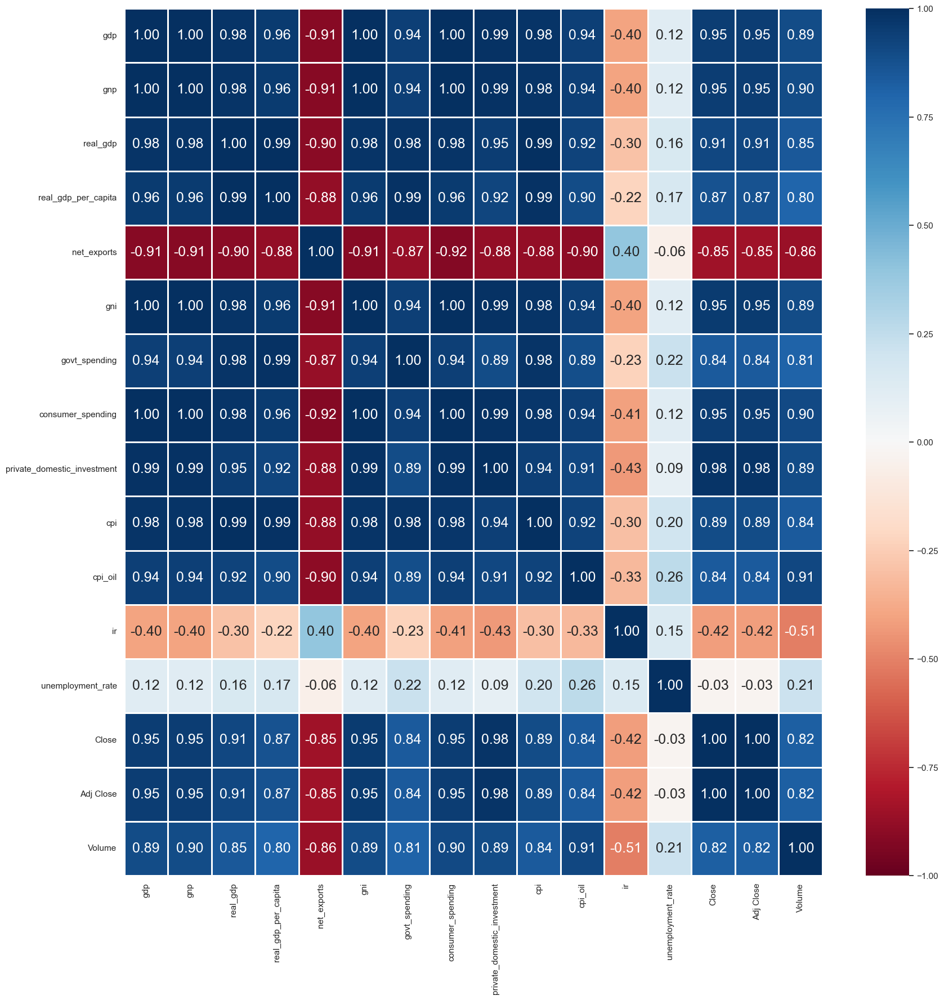

In [14]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(20, 20))
sb.heatmap(df_concat.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

# Cleaning Data

## Drop Variables

We start by dropping variables to narrow down the number of variables used in prediction. 


Correlation value measure the strength of the linear relationship between 2 varibles. Hence we use the correlation value as a indicator to drop varibles. We drop variables that have correlation values (absolute value) less than 0.9 with `Close`.
The 6 variables used are `GDP`, `GNP`, `Real GDP`, `GNI`, `Consumer Spending`, `Private Domestic Investment`. We also drop `Adj Close` since it has the same values as `Close`.

#### Statistics aside, these variables are also the most realistic variables to be used to predict Close values. 

`GDP` can indicate the performances of firms. An increase in `GDP` would mean that firms are performing well and likely lead to an increase in market values. 

`GNI` is an indicator of a country's economic growth. A high `GNI` would indicate a strong economy and imply a high performance of firms and hence market prices.

Increase in `Consumer Spending` can indicate increase in sales and hence leading to an increase in market values.

When `Private Domestic Investment` are made, demand for market shares increases, pushing up the prices of the shares especially in limited supply. Furthermore, `Private Domestic Investment` affects investment sentiments towards a market, where positive sentiment can push up the market price.

In [15]:
columns = ['real_gdp_per_capita', 'net_exports', 'govt_spending', 'cpi', 'cpi_oil', 'ir', 'unemployment_rate', 'Adj Close', 'Volume']
df_clean = df_concat.drop(columns, axis=1)
df_clean

,gdp,gnp,real_gdp,gni,consumer_spending,private_domestic_investment,Close
1950-01-01,280.828,282.056,2186.365,278.734,182.920,1.071,17.195001
1950-04-01,290.383,291.699,2253.045,291.250,186.806,1.164,18.270000
1950-07-01,308.153,309.760,2340.112,309.130,200.505,1.247,18.459999
1950-10-01,319.945,321.554,2384.920,320.905,197.946,1.289,19.850000
1951-01-01,336.000,337.537,2417.311,334.071,209.207,1.296,21.639999
...,...,...,...,...,...,...,...
2019-10-01,21706.532,21961.573,19215.691,22066.642,14619.042,530.682,3093.619995
2020-01-01,21538.032,21794.019,18989.877,22136.020,14440.160,542.381,3244.954956
2020-04-01,19636.731,19805.951,17378.712,20061.715,13049.766,537.107,2930.189941
2020-07-01,21362.428,21562.441,18743.720,21365.888,14388.701,561.469,3332.765014


### Correlation Matrix

<AxesSubplot:>

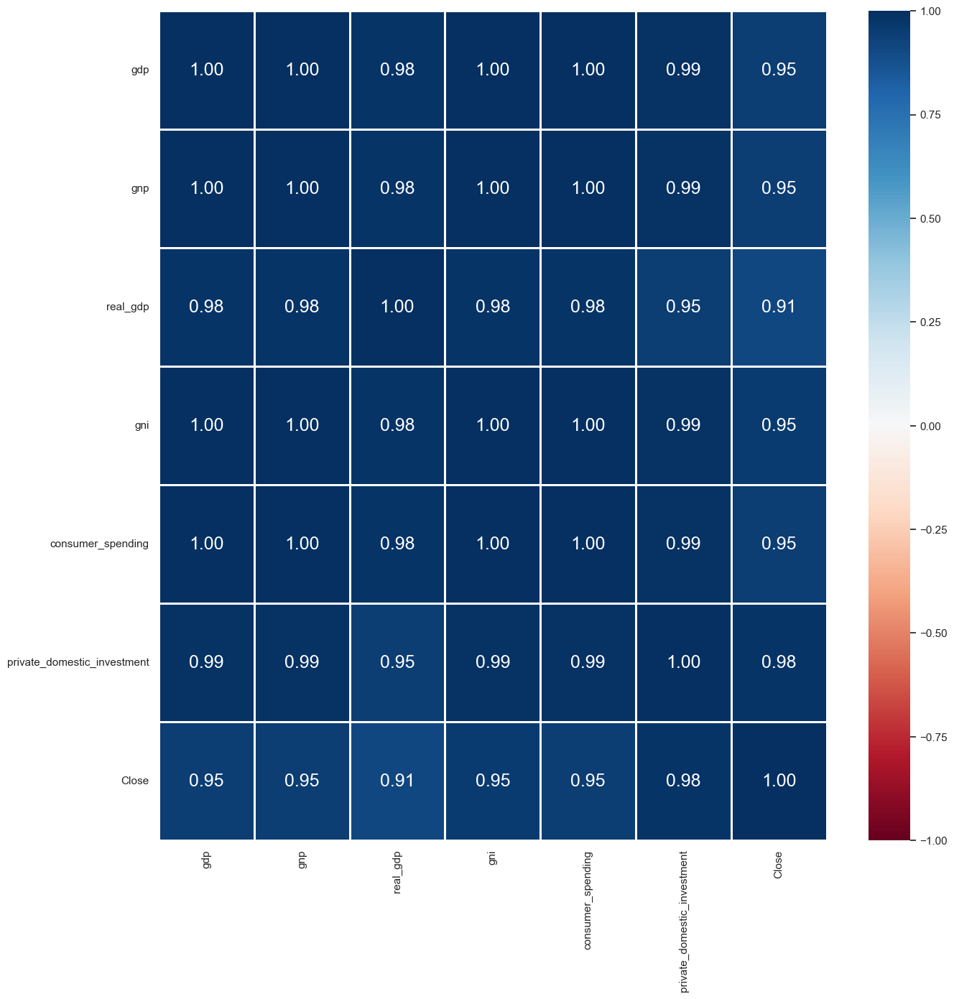

In [16]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(15, 15))
sb.heatmap(df_clean.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

### Pairplot

In [17]:
fig = go.Figure(data=go.Splom(
                  dimensions=[dict(label='S&P500 Price', values=df_clean['Close']),
                              dict(label='GDP', values=df_clean['gdp']),
                              dict(label='GNP', values=df_clean['gnp']),
                              dict(label='Real GDP', values=df_clean['real_gdp']),
                              dict(label='GNI', values=df_clean['gni']),
                              dict(label='Consumer Spending', values=df_clean['consumer_spending']),
                              dict(label='Private Domestic Investment', values=df_clean['private_domestic_investment']),],
                  marker=dict(size=2,
                              colorscale='Bluered',
                              line=dict(width=0.5, color='rgb(230,230,230)')),
                  diagonal=dict(visible=False)))

fig.update_layout(font=dict(size=8, color='black'),
                  dragmode='select',
                  width=1500,
                  height=1500,
                  hovermode='closest')

fig.show()

## Finding Outliers

Separate into 3 boxplots as their scales are different.

In [18]:
colors = ['#1f77b4']
fig = px.box(df_clean[['gdp', 'gnp', 'real_gdp', 'gni']], orientation='h', color_discrete_sequence=colors,  
             labels={
                     "value": "Billions of Dollars",
                     "variable": ""
             })
fig.show()

In [19]:
colors = ['#1f77b4']
fig = px.box(df_clean[['private_domestic_investment']], orientation='h', color_discrete_sequence=colors,  
             labels={
                     "value": "Billions of Dollars",
                     "variable": ""
             })
fig.show()

In [20]:
colors = ['#1f77b4']
fig = px.box(df_clean[['Close']], orientation='h', color_discrete_sequence=colors,  
             labels={
                     "value": "S&P 500 Price",
                     "variable": ""
             })
fig.show()

From the boxplots, we observed that `private_domestic_investment` and `Close` has outliers. Let's count the number of outliers.

In [21]:
Q1_pdi = df_clean['private_domestic_investment'].quantile(0.25)
Q3_pdi = df_clean['private_domestic_investment'].quantile(0.75)
IQR_pdi = Q3_pdi - Q1_pdi

In [22]:
((df_clean['private_domestic_investment'] < (Q1_pdi - 1.5 * IQR_pdi)) | (df_clean['private_domestic_investment'] > (Q3_pdi + 1.5 * IQR_pdi))).sum()

8

In [23]:
Q1_close = df_clean['Close'].quantile(0.25)
Q3_close = df_clean['Close'].quantile(0.75)
IQR_close = Q3_close - Q1_close

In [24]:
((df_clean['Close'] < (Q1_close - 1.5 * IQR_close)) | (df_clean['Close'] > (Q3_close + 1.5 * IQR_close))).sum()

12

From the codes, we know that `private_domestic_investment` has 8 outliers and `Close` has 12 outliers.

### Extract the rows with outliers

In [25]:
outliers_pdi = df_clean
outliers_pdi = outliers_pdi[(outliers_pdi['private_domestic_investment'] < Q1_pdi-1.5*IQR_pdi) | (outliers_pdi['private_domestic_investment'] > Q3_pdi+1.5*IQR_pdi)]
outliers_pdi

,gdp,gnp,real_gdp,gni,consumer_spending,private_domestic_investment,Close
2019-01-01,21013.085,21299.154,18835.411,21490.817,14145.897,498.098,2745.729980
2019-04-01,21272.448,21562.375,18962.175,21677.974,14323.749,512.729,2886.979980
2019-07-01,21531.839,21813.003,19130.932,21822.711,14482.196,522.137,2977.180054
2019-10-01,21706.532,21961.573,19215.691,22066.642,14619.042,530.682,3093.619995
2020-01-01,21538.032,21794.019,18989.877,22136.020,14440.160,542.381,3244.954956
2020-04-01,19636.731,19805.951,17378.712,20061.715,13049.766,537.107,2930.189941
2020-07-01,21362.428,21562.441,18743.720,21365.888,14388.701,561.469,3332.765014
2020-10-01,21704.706,21867.367,18924.262,22325.818,14586.036,586.224,3426.919922


From the first column, which are dates, we found out that all the outliers are continuous which are from 2019 Q1 until 2020 Q4. Thus, these 8 values might not be outliers but are just sudden rises in private domestic investment.

In [26]:
outliers_close = df_clean
outliers_close = outliers_close[(outliers_close['Close'] < Q1_close-1.5*IQR_close) | (outliers_close['Close'] > Q3_close+1.5*IQR_close)]
outliers_close

,gdp,gnp,real_gdp,gni,consumer_spending,private_domestic_investment,Close
2018-01-01,20155.486,20467.925,18437.127,20574.837,13677.349,447.647,2732.219971
2018-04-01,20470.197,20772.518,18565.697,20787.673,13850.838,463.342,2712.209961
2018-07-01,20687.278,20958.320,18699.748,21091.158,13988.794,468.156,2853.580078
2018-10-01,20819.269,21094.695,18733.741,21295.748,14102.937,482.915,2722.179932
2019-01-01,21013.085,21299.154,18835.411,21490.817,14145.897,498.098,2745.729980
2019-04-01,21272.448,21562.375,18962.175,21677.974,14323.749,512.729,2886.979980
2019-07-01,21531.839,21813.003,19130.932,21822.711,14482.196,522.137,2977.180054
2019-10-01,21706.532,21961.573,19215.691,22066.642,14619.042,530.682,3093.619995
2020-01-01,21538.032,21794.019,18989.877,22136.020,14440.160,542.381,3244.954956
2020-04-01,19636.731,19805.951,17378.712,20061.715,13049.766,537.107,2930.189941


From the first column, which are dates, we found out that all the outliers are continuous which are from 2018 Q1 until 2020 Q4. Thus, these 12 values might not be outliers but are just sudden rises in closing price of S&P 500.

# Data Science Pipeline : Exploratory Analysis & Analytic Visualisation

## Candlestick Plot

### Using Plotly

In [27]:
fig = go.Figure(data=[go.Candlestick(x=SPX_copy.index,
                open=SPX_copy['Open'], high=SPX_copy['High'],
                low=SPX_copy['Low'], close=SPX_copy['Close'], 
                name = "S&P 500")
                     ])
fig.update_layout(xaxis_rangeslider_visible=False) #optional
fig.update_layout(yaxis_title='S&P 500')
fig.show()

#### Add Moving Average (MA) to the Plot

In [28]:
#moving average of 20 periods
avg_20 = SPX.Close.rolling(window = 20, min_periods = 1).mean()
#moving average of 50 periods
avg_50 = SPX.Close.rolling(window = 50, min_periods = 1).mean()
#moving average of 100 periods
avg_100 = SPX.Close.rolling(window = 100, min_periods = 1).mean()

In [29]:
fig.add_trace(go.Scatter(x=SPX.index, y=avg_20, name = "Moving Average of 20 Periods", line=dict(color='orange', width=1)))
fig.add_trace(go.Scatter(x=SPX.index, y=avg_50, name = "Moving Average of 50 Periods", line=dict(color='green', width=1)))
fig.add_trace(go.Scatter(x=SPX.index, y=avg_100, name = "Moving Average of 100 Periods", line=dict(color='blue', width=1)))

## Time Series Plot

In [30]:
fig = px.line(df_clean)
fig.show()

From the time series plot, we observe that there is an overall increasing trend for all the variables.

# Data Science Pipeline : Algorithmic Optimisation

In [31]:
# Create a dictionary to store all of our model training scores to view later
model_scores = {}

# 1) Long Short-Term Memory (LSTM) Predictive Model

In [32]:
# Extract 80% of the closing prices from our acquired stock data as our training set
close_prices = df_clean['Close']
values = close_prices.values
training_data_len = math.ceil(len(values)* 0.8)

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(values.reshape(-1,1))
train_data = scaled_data[0: training_data_len, :]

x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    
x_train, y_train = np.array(x_train), np.array(y_train)
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

In [33]:
#Prepare a test set
test_data = scaled_data[training_data_len-60: , : ]
x_test = []
y_test = values[training_data_len:]

for i in range(60, len(test_data)):
  x_test.append(test_data[i-60:i, 0])

x_test = np.array(x_test)
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

In [34]:
# Set up our LSTM Network Architecture
model = keras.Sequential()
model.add(layers.LSTM(100, return_sequences=True, input_shape=(x_train.shape[1], 1)))
model.add(layers.LSTM(100, return_sequences=False))
model.add(layers.Dense(25))
model.add(layers.Dense(1))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 60, 100)           40800     
                                                                 
 lstm_1 (LSTM)               (None, 100)               80400     
                                                                 
 dense (Dense)               (None, 25)                2525      
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
                                                                 
Total params: 123,751
Trainable params: 123,751
Non-trainable params: 0
_________________________________________________________________


In [35]:
# Train our LSTM model by fitting it with the training set
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, batch_size= 1, epochs=3)

Epoch 1/3
168/168 [==============================] - 13s 48ms/step - loss: 0.0038
Epoch 2/3
168/168 [==============================] - 8s 49ms/step - loss: 0.0017
Epoch 3/3
168/168 [==============================] - 8s 48ms/step - loss: 8.7585e-04


In [36]:
# Apply the root mean square error (RMSE) metric to examine the performance of the model.
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)
rmse = np.sqrt(np.mean(predictions - y_test)**2)
print("RMSE value of test model:", rmse)

2/2 [==============================] - 2s 49ms/step
RMSE value of test model: 51.597890569614925


In [37]:
model_scores['LSTM_Test'] = rmse
model_scores

{'LSTM_Test': 51.597890569614925}

In [38]:
# Visualizing the Predicted Prices
data = df_clean.filter(['Close'])
train = data[:training_data_len]
validation = data[training_data_len:]
validation['Predictions'] = predictions

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=train.index,
    y=train['Close'],
    name = 'Train',
))

fig.add_trace(go.Scatter(
    x=validation.index,
    y=validation['Close'],
    name = 'Validation',
))

fig.add_trace(go.Scatter(
    x=validation.index,
    y=validation['Predictions'],
    name = 'Predictions',
))

fig.update_layout(title = "LSTM - Forecast of Close Price")
fig.update_layout(yaxis_title='Close Price USD ($)')
fig.update_layout(xaxis_title='Date')

fig.show()

C:\Users\betti\AppData\Local\Temp\ipykernel_7704\2262999606.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



We can observe that the predicted S&P 500 index price follow the trend of the real one closely. This shows the effectiveness of the LSTM to work with time series or sequential data like the index prices.

## Comparing RMSE with Test Data Set using Linear Regression

In [39]:
# Extract 80% of the closing prices from our acquired stock data as our training set
numbers = list(range(1, 228))
x_train = pd.DataFrame(numbers)
y_train = pd.DataFrame(close_prices[:227])

numbers_test = list(range(227, 284))
x_test = pd.DataFrame(numbers_test)
y_test = pd.DataFrame(close_prices[227:])

In [40]:
# Create a Linear Regression object
linreg = LinearRegression()
linreg_test = LinearRegression()

In [41]:
linreg.fit(x_train, y_train)

LinearRegression()

In [42]:
linreg_test.fit(x_test, y_test)

LinearRegression()

In [43]:
# Mean Squared Error (MSE)
def mean_sq_err(actual, predicted):
    '''Returns the Mean Squared Error of actual and predicted values'''
    return np.mean(np.square(np.array(actual) - np.array(predicted)))

y_train_pred = linreg.predict(x_train)
y_test_pred = linreg_test.predict(x_test)

mse_train = mean_sq_err(y_train, y_train_pred)
mse_test = mean_sq_err(y_test, y_test_pred)
model_scores['Linear Regression Train'] = np.sqrt(mse_train)
model_scores['Linear Regression Test'] = np.sqrt(mse_test)

print("Root Mean Squared Error (RMSE) of Train Linear Regression \t:", np.sqrt(mse_train))
print("Root Mean Squared Error (RMSE) of Test Linear Regression \t:", np.sqrt(mse_test))
print("LSTM Predictive Model's RMSE shows",int(abs(((rmse-np.sqrt(mse_test))/rmse)*100)),"% lower than Test Linear Regression's RMSE using Test Dataset")

Root Mean Squared Error (RMSE) of Train Linear Regression 	: 232.61372092426458
Root Mean Squared Error (RMSE) of Test Linear Regression 	: 272.8623891859237
LSTM Predictive Model's RMSE shows 428 % lower than Test Linear Regression's RMSE using Test Dataset


#### By comparing the RMSE of Test Data, LSTM Predictive Model shows Higher Accuracy than Linear Regression

In [44]:
model_scores

{'LSTM_Test': 51.597890569614925,
 'Linear Regression Train': 232.61372092426458,
 'Linear Regression Test': 272.8623891859237}

# 2) ARIMA Predictive Model

## Train Test Split

In [45]:
series = pd.DataFrame(df_clean['Close'])

train_len = 227

# Train Set : 80% (227 samples)
x_train = pd.DataFrame(series[:train_len])

# Test Set : 20% (57 samples)
x_test = pd.DataFrame(series[train_len:])

# Check the sample sizes
print("Train Set :", x_train.shape)
print("Test Set  :", x_test.shape)

Train Set : (227, 1)
Test Set  : (57, 1)


In [46]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=x_train.index,
    y=x_train['Close'],
    name = 'Train Data',
))

fig.add_trace(go.Scatter(
    x=x_test.index,
    y=x_test['Close'],
    name = 'Test Data',
))

fig.update_layout(title = "S&P 500 Price")
fig.update_layout(yaxis_title='Billion of Dollars')
fig.update_layout(xaxis_title='Date')

fig.show()

## Step 1: Check if the Data is Stationary

### Use Augmented Dickey Fuller Test

In [47]:
#Test for stationarity
def test_stationarity(timeseries, windowroll = 12, cutoff = 0.05):    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=windowroll).mean()
    rolstd = timeseries.rolling(window=windowroll).std()
    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    # H_0 in adfuller is unit root exists (Non-Stationary)
    # We must observe significant p-value to convince ourselves tha the series is stationary
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    pvalue = dftest[1]
    if pvalue <= cutoff:
        print('p-value = '+ str(pvalue) + ' The series is likely stationary.')
        #return True
    else:
        print('p-value = '+ str(pvalue) + ' The series is likely non-stationary.')
        #return False
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

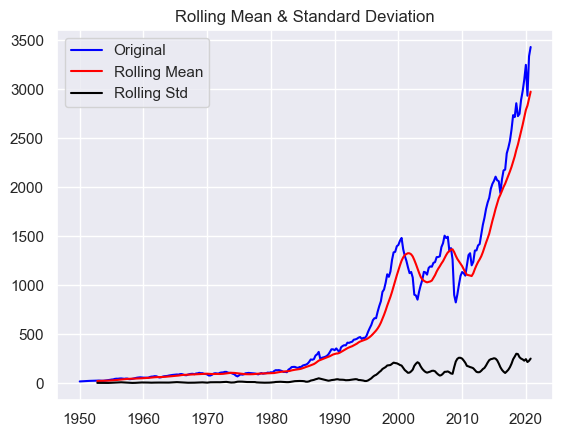

Results of Dickey-Fuller Test:
p-value = 0.99908005900009 The series is likely non-stationary.
Test Statistic                   2.629695
p-value                          0.999080
#Lags Used                      15.000000
Number of Observations Used    268.000000
Critical Value (1%)             -3.454988
Critical Value (5%)             -2.872386
Critical Value (10%)            -2.572549
dtype: float64


In [48]:
test_stationarity(series)

The **p-value is obtained is greater than significance level of 0.05** and the **ADF (Augmented Dickey-Fuller) statistic is higher than any of the critical values**.

The null hypothesis is not rejected. So, the time series is **non-stationary**.

## Step 2: Differencing

Since our data in not stationary, we must convert our non-stationary data to stationary data using the differencing method. This means we take the value at time (t) and subtract the value at time (t-1) to get the difference.

In [49]:
# Get the difference of each Adj Close point
close_diff_1 = series.diff()
close_diff_1.dropna(inplace=True)

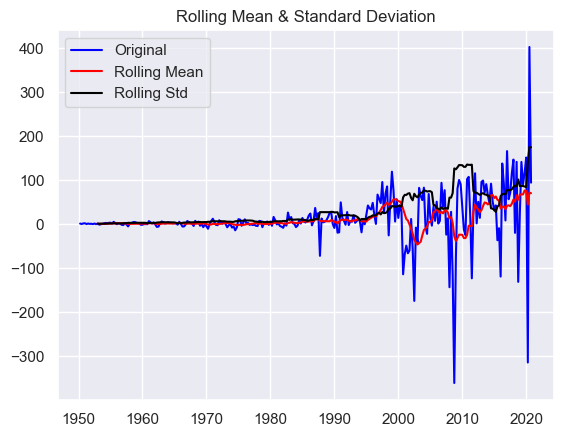

Results of Dickey-Fuller Test:
p-value = 0.10885871536566522 The series is likely non-stationary.
Test Statistic                  -2.527788
p-value                          0.108859
#Lags Used                      14.000000
Number of Observations Used    268.000000
Critical Value (1%)             -3.454988
Critical Value (5%)             -2.872386
Critical Value (10%)            -2.572549
dtype: float64


In [50]:
test_stationarity(close_diff_1)

The **p-value is obtained is less than significance level of 0.05** and the **ADF statistic is lower than any of the critical values**.

The null hypothesis is rejected. So, the time series is **stationary**.

## Step 3: Autocorrelation and Partial autocorrelation

Autocorrelation is the correlation between points at time t ($P_{t}$) and the point at($P_{t-1}$). Partial autocorrelation is the point at time t ($P_{t}$) and the point ($P_{t-k}$) where k is any number of lags. Partial autocorrelation ignores all of the data in between both points.

This step is important in determining the p (AR term) and q (MA term) value in the ARIMA model.

The order of p (AR term) is equal to as many lags that crosses the significance limit in the PACF plot.

The order of q (MA term) is equal to as many lags that crosses the significance limit in the ACF plot.

In [51]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

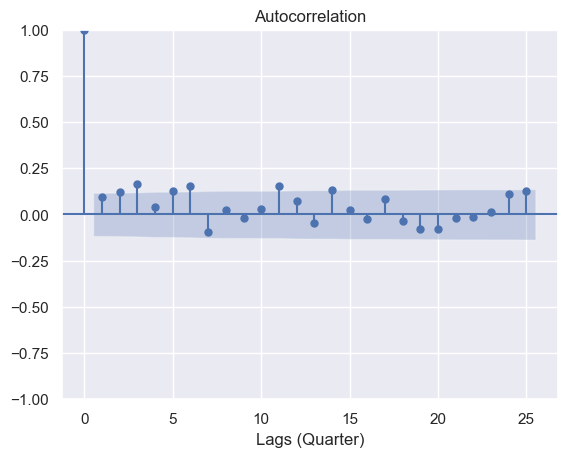

In [52]:
plot_acf(close_diff_1)
plt.xlabel('Lags (Quarter)')
plt.show()

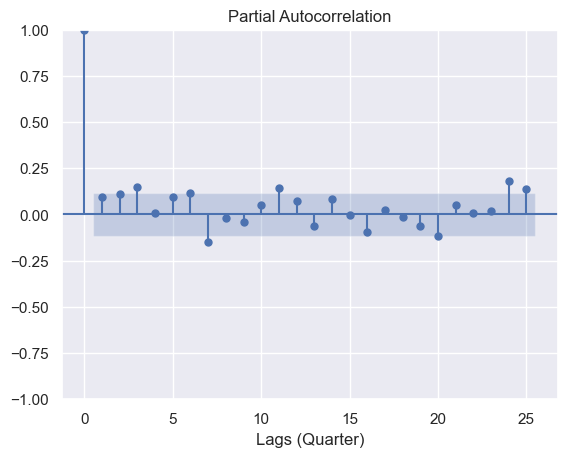

In [53]:
plot_pacf(close_diff_1, method = 'ywm')
plt.xlabel('Lags (Quarter)')
plt.show()

### Differencing the Series for the Second Time

We now try to difference the series again and determine the d term for the ARIMA model.

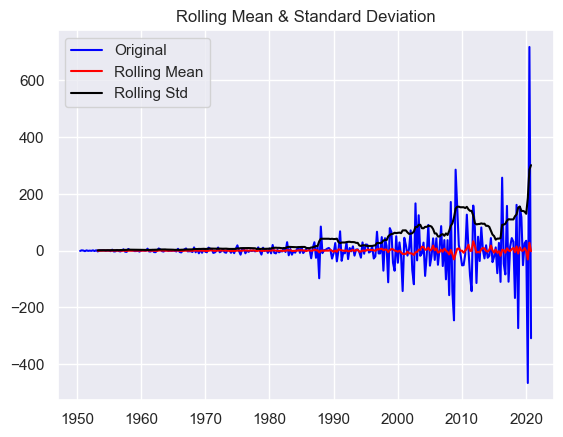

Results of Dickey-Fuller Test:
p-value = 3.7894680404522645e-13 The series is likely stationary.
Test Statistic                -8.310992e+00
p-value                        3.789468e-13
#Lags Used                     1.200000e+01
Number of Observations Used    2.690000e+02
Critical Value (1%)           -3.454896e+00
Critical Value (5%)           -2.872345e+00
Critical Value (10%)          -2.572528e+00
dtype: float64


In [54]:
close_diff_2 = (series.diff()).diff()
close_diff_2.dropna(inplace=True)
test_stationarity(close_diff_2)

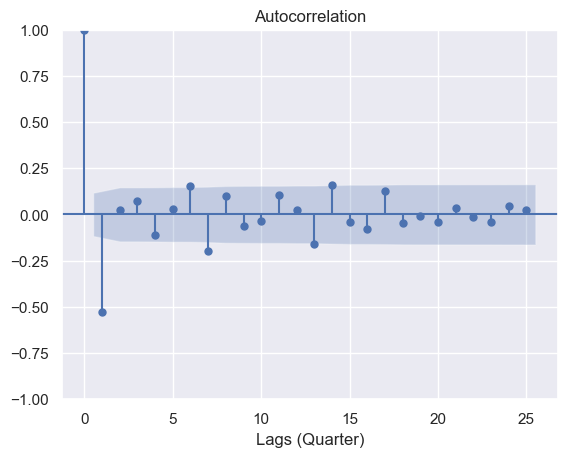

In [55]:
plot_acf(close_diff_2)
plt.xlabel('Lags (Quarter)')
plt.show()

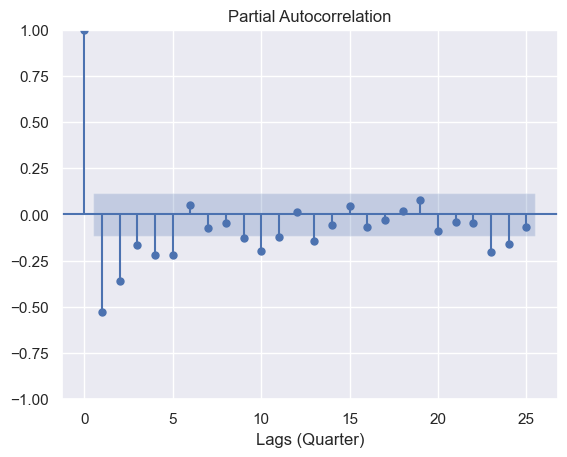

In [56]:
plot_pacf(close_diff_2, method = 'ywm')
plt.xlabel('Lags (Quarter)')
plt.show()

### Testing Different ARIMA Models

In [57]:
#fit model
spx_arima = ARIMA(x_train, order=(1,1,1))
spx_arima_fit = spx_arima.fit()
print(spx_arima_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  227
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -1048.508
Date:                Tue, 04 Apr 2023   AIC                           2103.016
Time:                        21:09:48   BIC                           2113.278
Sample:                    01-01-1950   HQIC                          2107.157
                         - 07-01-2006                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8168      0.034     23.753      0.000       0.749       0.884
ma.L1         -0.5060      0.059     -8.562      0.000      -0.622      -0.390
sigma2       626.0622     22.670     27.617      0.0

In [58]:
spx_arima = ARIMA(x_train, order=(2,2,1))
spx_arima_fit = spx_arima.fit()
print(spx_arima_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  227
Model:                 ARIMA(2, 2, 1)   Log Likelihood               -1051.365
Date:                Tue, 04 Apr 2023   AIC                           2110.730
Time:                        21:09:48   BIC                           2124.394
Sample:                    01-01-1950   HQIC                          2116.245
                         - 07-01-2006                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0256      0.073     -0.352      0.725      -0.168       0.117
ar.L2         -0.1106      0.037     -2.969      0.003      -0.184      -0.038
ma.L1         -0.5858      0.062     -9.439      0.0

The lower the value of AIC, the better the model is. Since we are not sure if these two models are the best one we could find, we use `auto_arima` to help us determine the best model.

### Determining the Optimal ARIMA model Using `auto_arima`

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2150.365, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2111.710, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2120.424, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2157.415, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2108.431, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=2099.457, Time=0.20 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=2100.068, Time=0.29 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2099.669, Time=0.53 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2105.216, Time=0.34 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=2101.668, Time=0.80 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=2099.276, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=2109.159, Time=0.12 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=2100.148, Time=0.18 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=2099.699, Time=0.25 sec
 ARIMA(2,1,1)(0,0,0)[0]          

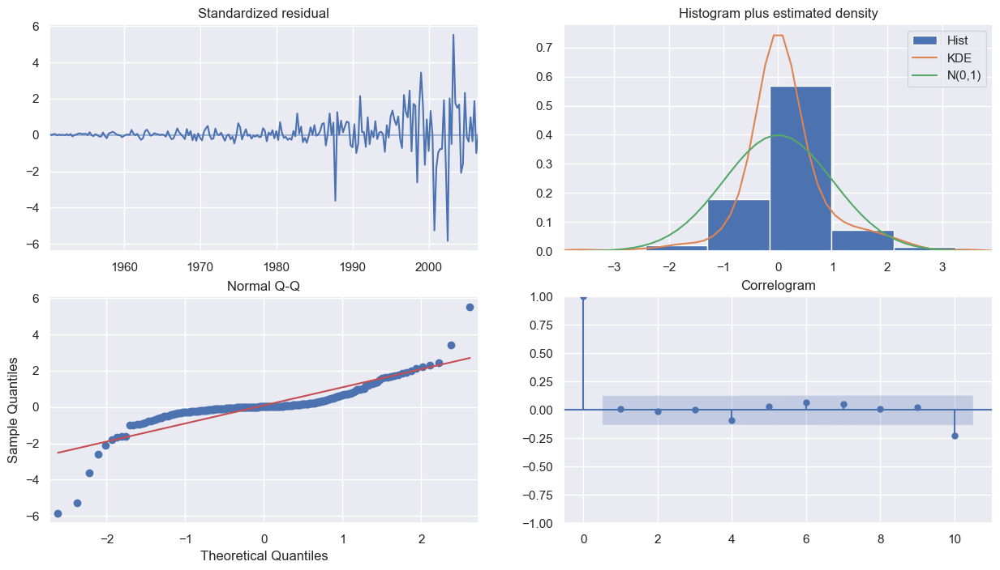

In [59]:
model_autoARIMA = auto_arima(x_train, start_p=0, start_q=0,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=4, max_q=4, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)
print(model_autoARIMA.summary())
model_autoARIMA.plot_diagnostics(figsize=(15,8))
plt.show()

From the result of `auto_arima`, we obtain that the best model is `ARIMA(3,1,0)`.

## Step 4: Building the ARIMA Model and Forecasting

In [60]:
# Build Model
model = ARIMA(x_train, order=(3,1,0))
model_fit = model.fit()
fitted = model.fit()

#Forecast
forecast_test = model_fit.forecast(len(x_test))

In [61]:
# Visualizing the Predicted Prices
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=train.index,
    y=train['Close'],
    name = 'Train',
))

fig.add_trace(go.Scatter(
    x=x_test.index,
    y=x_test['Close'],
    name = 'Test',
))

fig.add_trace(go.Scatter(
    x=forecast_test.index,
    y=forecast_test,
    name = 'Predictions',
))

fig.update_layout(title = "ARIMA - Forecast of Close Price")
fig.update_layout(yaxis_title='Close Price USD ($)')
fig.update_layout(xaxis_title='Date')

fig.show()

In [62]:
# Plot our predictions against the actual values for a visual comparison.
# Visualizing the Predicted Prices
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=x_test.index,
    y=x_test['Close'],
    name = 'Test',
))

fig.add_trace(go.Scatter(
    x=forecast_test.index,
    y=forecast_test,
    name = 'Predictions',
))

fig.update_layout(title = "ARIMA - Forecast of Close Price")
fig.update_layout(yaxis_title='Close Price USD ($)')
fig.update_layout(xaxis_title='Date')

fig.show()

In [63]:
# Forecast
model_predictions = fitted.forecast(57)

In [64]:
%store model_predictions

Stored 'model_predictions' (Series)


In [65]:
# %store model_predictions
%store -r model_predictions

# Check to see if it reloaded
model_predictions[:5]

2006-10-01    1306.930227
2007-01-01    1312.241607
2007-04-01    1316.749219
2007-07-01    1321.791114
2007-10-01    1324.980278
Freq: QS-OCT, Name: predicted_mean, dtype: float64

In [66]:
#save model
model_fit.save('arima_310.pkl')

# Load model
loaded = ARIMAResults.load('arima_310.pkl')

In [67]:
model_predictions = np.array(model_predictions).flatten()

In [68]:
# Calculate MSE
arima_mse = keras.metrics.mean_squared_error(x_test['Close'].to_numpy(), model_predictions).numpy()

# Save to our dictionary of model scores
model_scores['ARIMA'] = math.sqrt(arima_mse)
model_scores

{'LSTM_Test': 51.597890569614925,
 'Linear Regression Train': 232.61372092426458,
 'Linear Regression Test': 272.8623891859237,
 'ARIMA': 890.3537042779377}

# SARIMA Predictive Model

To also account for seasonality, we use SARIMA to predict the values for `Close`. 

In [69]:
def forecast(SARIMA_model, periods=57):
    # Forecast
    n_periods = periods
    fitted, confint = SARIMA_model.predict(n_periods=n_periods, return_conf_int=True)
    index_of_fc = pd.date_range(x_train.index[-1] + pd.DateOffset(months=3), periods = n_periods, freq='QS')

    # make series for plotting purpose
    fitted_series = pd.Series(fitted, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=x_train.index,
        y=x_train['Close'],
        name = 'Train'
    ))

    fig.add_trace(go.Scatter(
        x=lower_series.index, 
        y=lower_series,
        fill=None,
        mode='lines',
        line_color='rgb(111, 231, 219)',
        name = 'Lower Bound'
    ))
    
    fig.add_trace(go.Scatter(
        x=upper_series.index,
        y=upper_series,
        fill='tonexty', # fill area between trace0 and trace1
        mode='lines', 
        line_color='rgb(111, 231, 219)',
        name = 'Upper Bound'
    ))
    
    fig.add_trace(go.Scatter(
        x=x_test.index,
        y=x_test['Close'],
        name = 'Test',
        line_color = 'red'
    ))
    
    fig.add_trace(go.Scatter(
        x=fitted_series.index,
        y=fitted_series,
        name = 'Predictions',
        line_color = 'darkgreen'
    ))

    fig.update_layout(title = "SARIMA - Forecast of Close Price")
    fig.update_layout(yaxis_title='Close Price USD ($)')
    fig.update_layout(xaxis_title='Date')

    fig.show()
    
    return fitted_series

In [70]:
# Seasonal - fit stepwise auto-ARIMA
SARIMA_model = pm.auto_arima(x_train, start_p=0, start_q=0,
                         test='adf',
                         max_p=4, max_q=4, 
                         m=4, #4 is the frequency of the cycle
                         start_P=0, 
                         seasonal=True, #set to seasonal
                         d=None, 
                         D=2, #order of the seasonal differencing
                         trace=False,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

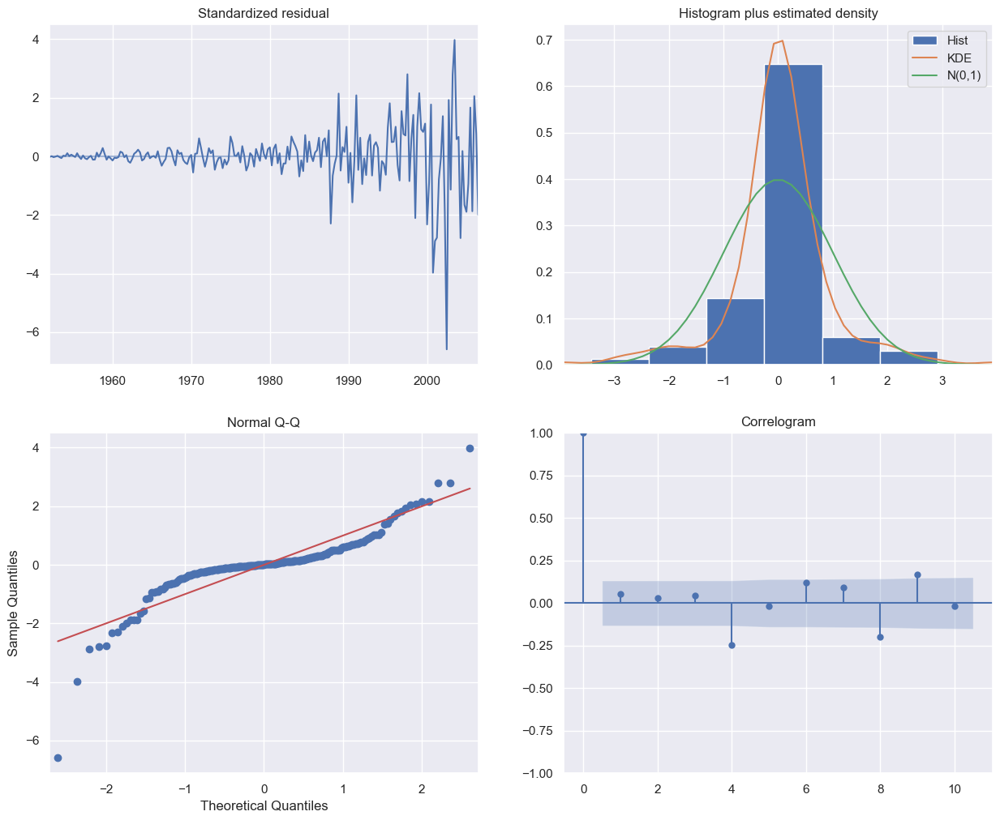

In [71]:
SARIMA_model.plot_diagnostics(figsize=(15,12))
plt.show()

In [72]:
predicted = forecast(SARIMA_model)

In [73]:
# Calculate MSE
sarima_mse = keras.metrics.mean_squared_error(x_test['Close'].to_numpy(), predicted).numpy()

# Save to our dictionary of model scores
model_scores['SARIMA'] = math.sqrt(sarima_mse)
model_scores

{'LSTM_Test': 51.597890569614925,
 'Linear Regression Train': 232.61372092426458,
 'Linear Regression Test': 272.8623891859237,
 'ARIMA': 890.3537042779377,
 'SARIMA': 1082.2973032709044}